## Faster R-CNN with ResNet-50 FPN backbone
- model
  - 800 iters on 0.01 of training set -> rougly 10 epoch
  - data augmentation included
- result:
```
|   AP   |  AP50  |  AP75  |  APs  |  APm  |  APl   |
|:------:|:------:|:------:|:-----:|:-----:|:------:|
| 26.720 | 46.142 | 28.362 |  nan  | 1.122 | 30.002 |
```

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15280, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 15280 (delta 0), reused 1 (delta 0), pack-reused 15275
Receiving objects: 100% (15280/15280), 6.17 MiB | 5.11 MiB/s, done.
Resolving deltas: 100% (11111/11111), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00
  Preparin

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.1 ; cuda:  cu118
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!pip install opendatasets
import opendatasets as od
import tensorflow as tf
with tf.device('/GPU:0'):
  od.download("https://www.kaggle.com/datasets/thedatasith/sku110k-annotations")

#19a4ffe0725df3c01cf6f2192353af63

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: yenchingp
Your Kaggle Key: ··········


100%|██████████| 13.2G/13.2G [11:26<00:00, 20.6MB/s]


In [ ]:
import json
import os
import random
from PIL import Image

def list_images(directory, fraction=1.0):
    all_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]
    if fraction < 1.0:
        selected_files = random.sample(all_files, int(len(all_files) * fraction))
        return selected_files
    return all_files

def get_image_dimensions(image_path):
    with Image.open(image_path) as img:
        return img.width, img.height

def create_coco_annotations(image_dir, label_dir, output_dir, subset, fraction=0.01):
    coco_data = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 1, "name": "object"}]
    }
    annotation_id = 1
    image_id_mapping = {}

    subset_image_dir = os.path.join(image_dir, subset)
    subset_label_dir = os.path.join(label_dir, subset)

    for image_path in list_images(subset_image_dir, fraction):
        base_image_name = os.path.basename(image_path)
        image_id = image_id_mapping.setdefault(base_image_name, len(image_id_mapping) + 1)
        width, height = get_image_dimensions(image_path)

        coco_data["images"].append({
            "id": image_id,
            "width": width,
            "height": height,
            "file_name": base_image_name
        })

        label_file = os.path.join(subset_label_dir, os.path.splitext(base_image_name)[0] + '.txt')
        if os.path.exists(label_file):
            with open(label_file, 'r') as file:
                for line in file:
                    class_id, x_center, y_center, bbox_width, bbox_height = map(float, line.strip().split())

                    x_min = (x_center - bbox_width / 2) * width
                    y_min = (y_center - bbox_height / 2) * height
                    abs_width = bbox_width * width
                    abs_height = bbox_height * height

                    coco_data["annotations"].append({
                        "id": annotation_id,
                        "image_id": image_id,
                        "category_id": 1,
                        "bbox": [x_min, y_min, abs_width, abs_height],
                        "area": abs_width * abs_height,
                        "iscrowd": 0
                    })
                    annotation_id += 1

    output_json_path = os.path.join(output_dir, f'coco_annotations_{subset}.json')
    with open(output_json_path, 'w') as f:
        json.dump(coco_data, f, indent=4)

image_dir = '/content/sku110k-annotations/SKU110K_fixed/images'
label_dir = '/content/sku110k-annotations/SKU110K_fixed/labels'
output_dir = '/content/sku110k-annotations/SKU110K_fixed/'

for subset in ['train', 'val', 'test']:
    create_coco_annotations(image_dir, label_dir, output_dir, subset)


## Register the dataset

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sku_train", {}, "/content/sku110k-annotations/SKU110K_fixed/coco_annotations_train.json", "/content/sku110k-annotations/SKU110K_fixed/images/train")
register_coco_instances("sku_val", {}, "/content/sku110k-annotations/SKU110K_fixed/coco_annotations_val.json", "/content/sku110k-annotations/SKU110K_fixed/images/val")

## Visualise dataset

In [ ]:
sku_metadata_train = MetadataCatalog.get('sku_train')
sku_dataset_dicts_train = DatasetCatalog.get("sku_train")

[11/13 02:45:12 d2.data.datasets.coco]: Loaded 81 images in COCO format from /content/sku110k-annotations/SKU110K_fixed/coco_annotations_train.json


In [ ]:
print(sku_dataset_dicts_train)

[{'file_name': '/content/sku110k-annotations/SKU110K_fixed/images/train/train_6434.jpg', 'height': 3264, 'width': 2448, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [1064.0, 2251.0, 146.0, 236.00000000000003], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [933.0000000000001, 2135.0, 89.0, 183.0], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [805.0, 2085.0, 118.0, 207.0], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [682.0, 2093.0000000000005, 92.0, 209.99999999999997], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [566.0, 2096.0, 84.00000000000001, 251.0], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [411.99999999999994, 2131.0, 68.0, 299.0], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [301.0, 2093.0, 91.0, 146.0], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0,

In [ ]:
for record in sku_dataset_dicts_train:
    record["image_id"] = int(record["image_id"])

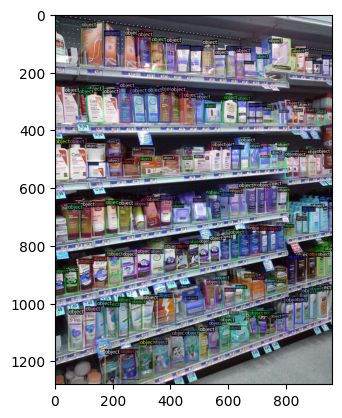

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt

for d in random.sample(sku_dataset_dicts_train, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sku_metadata_train , scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])

In [ ]:
## Check if GPU is available + Train

In [ ]:
import torch
print(torch.cuda.is_available())

True


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("sku_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 800    # adjust according to your dataset size
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   #default 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

# see augmentation details
def print_augmentation(cfg):
    train_loader = build_detection_train_loader(cfg)
    print(train_loader.dataset.mapper)
print_augmentation(cfg)

# Training
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# cfg.MODEL.DEVICE = 'cpu' # if not usig gpu
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/13 02:45:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 153MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[11/13 02:45:22 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/13 02:45:52 d2.utils.events]:  eta: 0:09:39  iter: 19  total_loss: 2.159  loss_cls: 0.6969  loss_box_reg: 0.5928  loss_rpn_cls: 0.6613  loss_rpn_loc: 0.232    time: 0.7824  last_time: 0.7790  data_time: 0.3091  last_data_time: 0.2430   lr: 6.1816e-06  max_mem: 3331M
[11/13 02:46:09 d2.utils.events]:  eta: 0:09:51  iter: 39  total_loss: 2.123  loss_cls: 0.6727  loss_box_reg: 0.6025  loss_rpn_cls: 0.6038  loss_rpn_loc: 0.2437    time: 0.8093  last_time: 0.6733  data_time: 0.2931  last_data_time: 0.2063   lr: 1.2425e-05  max_mem: 3331M
[11/13 02:46:24 d2.utils.events]:  eta: 0:09:35  iter: 59  total_loss: 1.836  loss_cls: 0.64  loss_box_reg: 0.6048  loss_rpn_cls: 0.3243  loss_rpn_loc: 0.2304    time: 0.8043  last_time: 0.8261  data_time: 0.2798  last_data_time: 0.3035   lr: 1.8669e-05  max_mem: 3331M
[11/13 02:46:41 d2.utils.events]:  eta: 0:09:20  iter: 79  total_loss: 1.646  loss_cls: 0.5916  loss_box_reg: 0.5954  loss_rpn_cls: 0.221  loss_rpn_loc: 0.2076    time: 0.8116  last_time:

## Graphs

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Save and visualise model output

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[11/13 02:56:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


[11/13 02:56:56 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/sku110k-annotations/SKU110K_fixed/coco_annotations_val.json


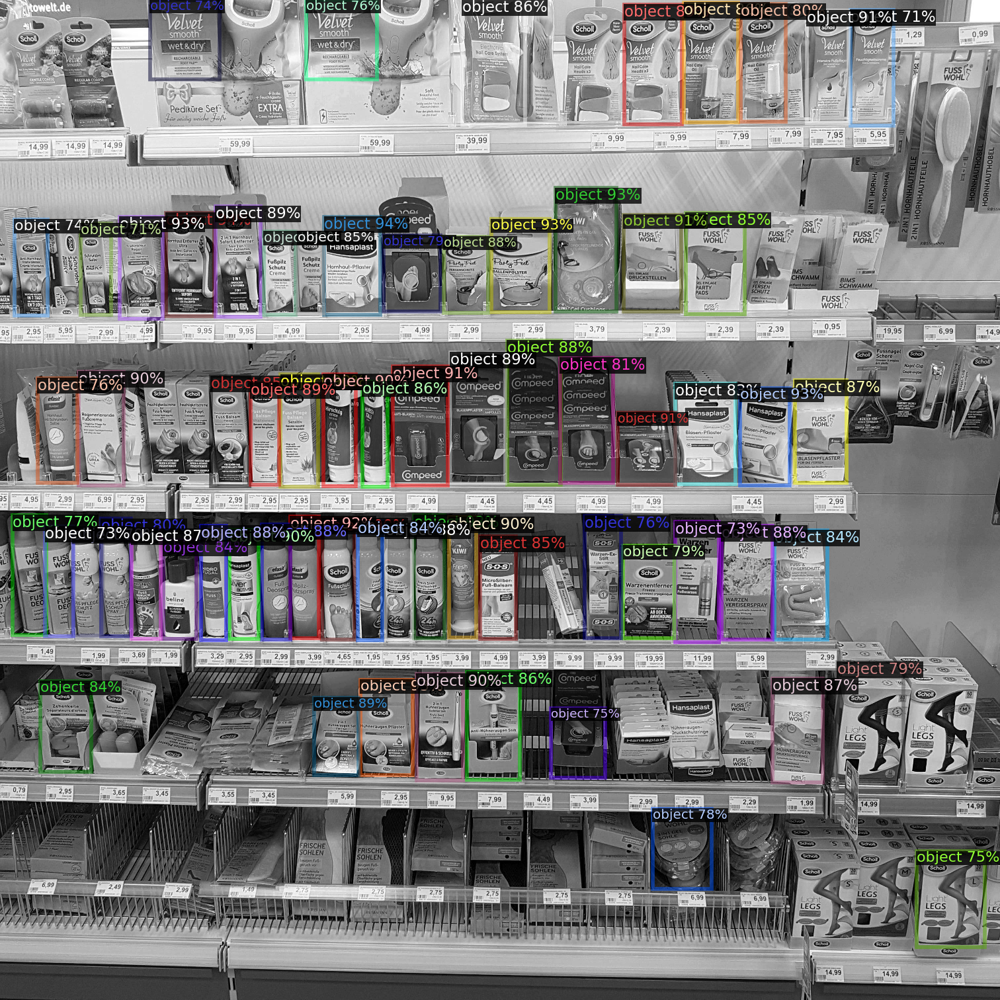

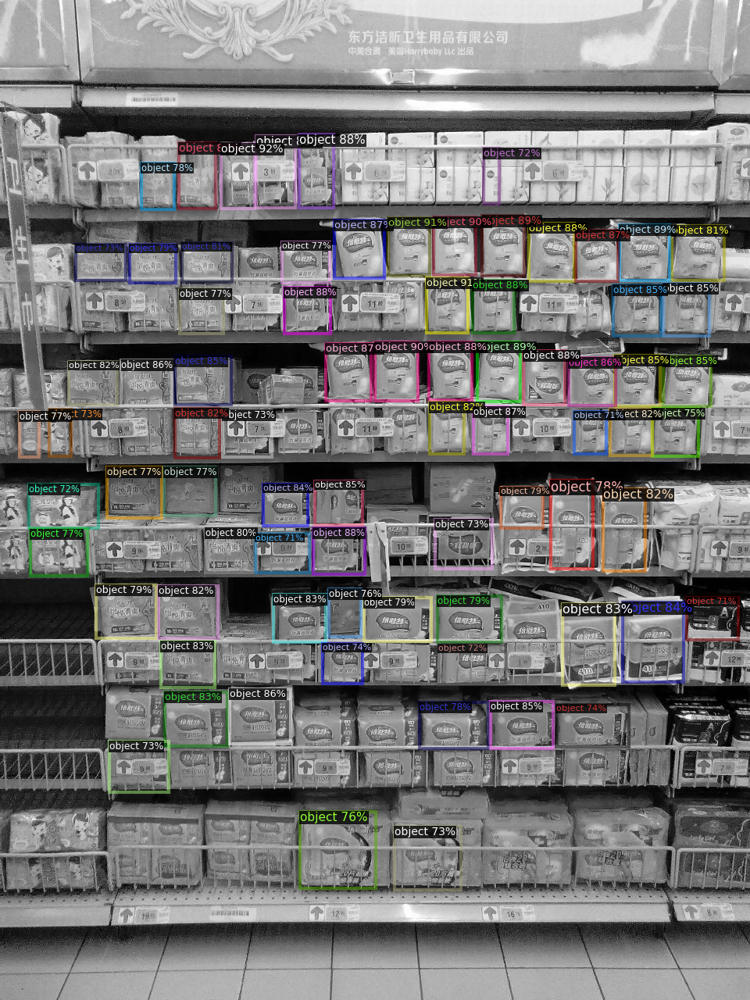

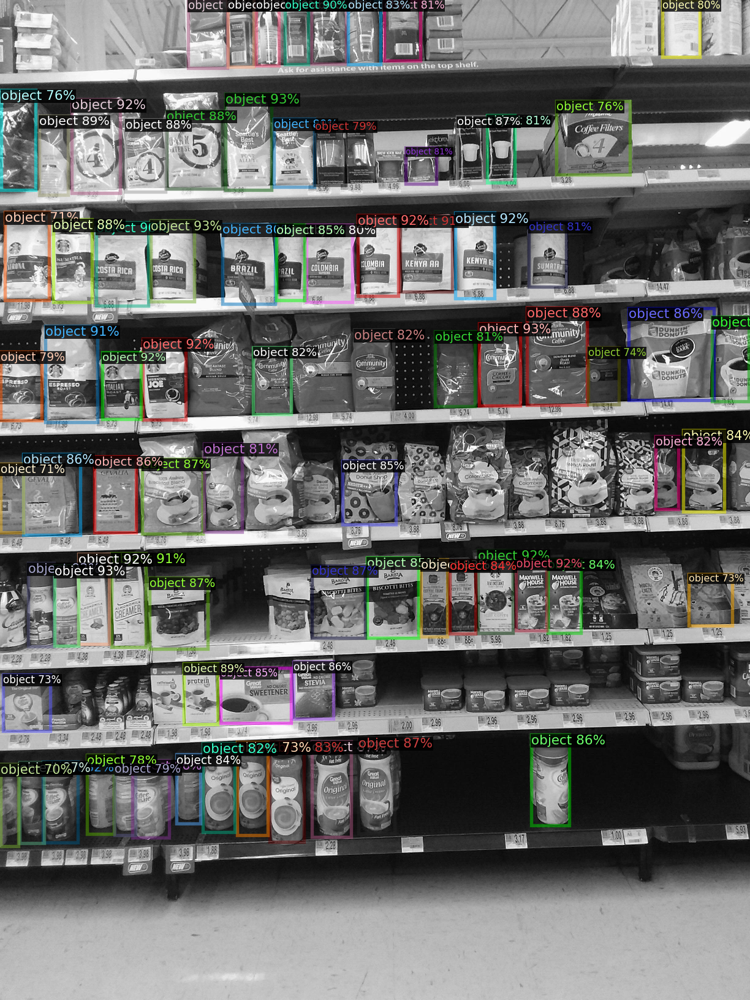

In [ ]:
from detectron2.utils.visualizer import ColorMode

sku_dataset_dicts_val = DatasetCatalog.get("sku_val")
sku_metadata_train = MetadataCatalog.get('sku_val')
dataset_dicts = sku_dataset_dicts_val
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=sku_metadata_train,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

## Evaluate model

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("sku_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "sku_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))


[11/13 02:57:05 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[11/13 02:57:05 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/sku110k-annotations/SKU110K_fixed/coco_annotations_val.json
[11/13 02:57:05 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   object   | 610          |
|            |              |
[11/13 02:57:05 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/13 02:57:05 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/13 02:57:05 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[11/13 02:57:05 d2.data.common]: Serialized dataset takes 0.03 MiB
[11/13 02:57:05 d2.evaluation.evaluator]: Start inference on 5 batches
[1